In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['font.size'] = 14
plt.rcParams['figure.max_open_warning'] = 200

In [2]:
NFFT = 2048
fs = 40e3
x = np.memmap('waterfall.f32', 'float32').reshape(-1, NFFT)
t = np.datetime64('2022-07-24T18:47:41.418') + (1e9 * NFFT / fs * np.arange(x.shape[0])) * np.timedelta64(1, 'ns')

In [3]:
freqsel = slice(NFFT//4, 3*NFFT//4+1)
med = np.median(x[:, freqsel], axis=1)
chi2_k = 2
median_correction = 1/(1-2/(9*chi2_k))**3
med *= median_correction
avg = np.average(x[:, freqsel], axis=1)

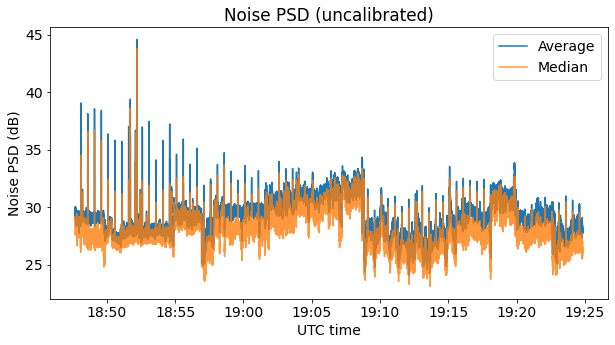

In [4]:
plt.plot(t, 10*np.log10(avg))
plt.plot(t, 10*np.log10(med), alpha=0.8)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.legend(['Average', 'Median'])
plt.xlabel('UTC time')
plt.ylabel('Noise PSD (dB)')
plt.title('Noise PSD (uncalibrated)');

In [5]:
transfer_to_dbm = -176
usrp_nf = 5.6
usrp_noise_mWHz = (10**(usrp_nf/10) - 1) * 10**(-174/10)
to_dbmHz = 10*np.log10(NFFT / fs) + transfer_to_dbm

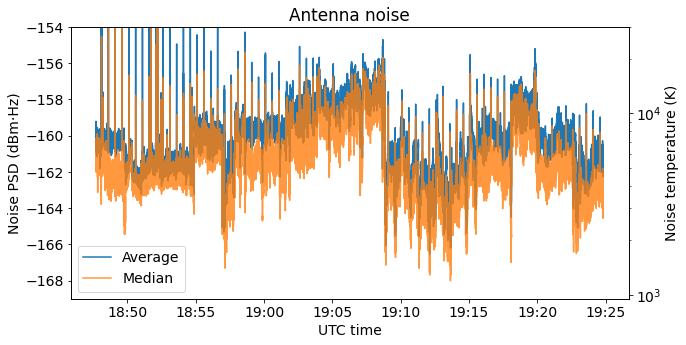

In [6]:
median_dbmHz = 10*np.log10(10**((10*np.log10(med) + to_dbmHz)/10) - usrp_noise_mWHz)
avg_dbmHz = 10*np.log10(10**((10*np.log10(avg) + to_dbmHz)/10) - usrp_noise_mWHz)
median_K = 10**((median_dbmHz + 174)/10) * 300
avg_K = 10**((avg_dbmHz + 174)/10) * 300
plt.plot(t, avg_dbmHz)
plt.plot(t, median_dbmHz, alpha=0.8)
plt.ylim((-169, -154))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.xlabel('UTC time')
plt.legend(['Average', 'Median'])
plt.ylabel('Noise PSD (dBm·Hz)')
plt.title('Antenna noise')
ax2 = plt.gca().twinx()
ax2.semilogy()
ax2.set_ylim((10**((-169+174)/10)*300, 10**((-154+174)/10)*300))
ax2.set_ylabel('Noise temperature (K)');

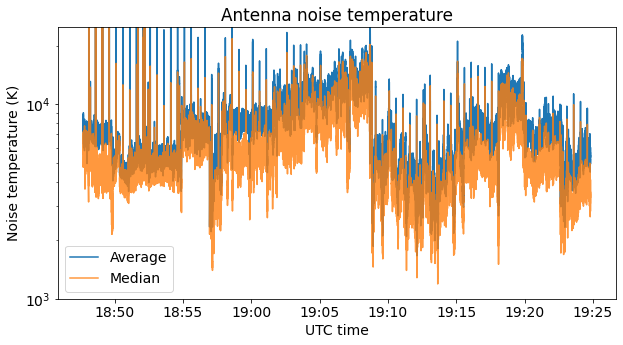

In [7]:
plt.semilogy(t, avg_K)
plt.semilogy(t, median_K, alpha=0.8)
plt.ylim((1000, 25000))
plt.xlabel('UTC time')
plt.legend(['Average', 'Median'])
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.ylabel('Noise temperature (K)');
plt.title('Antenna noise temperature');

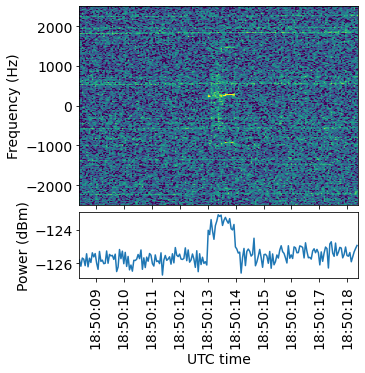

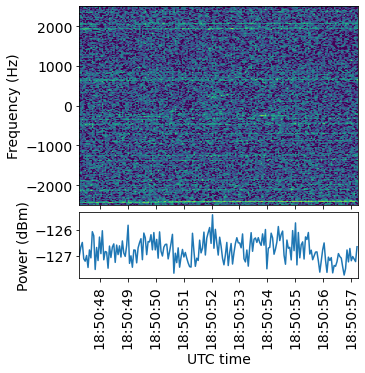

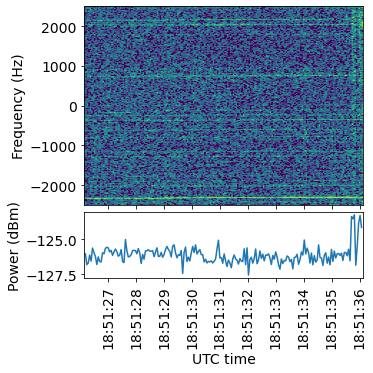

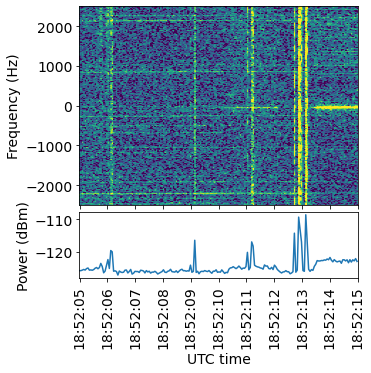

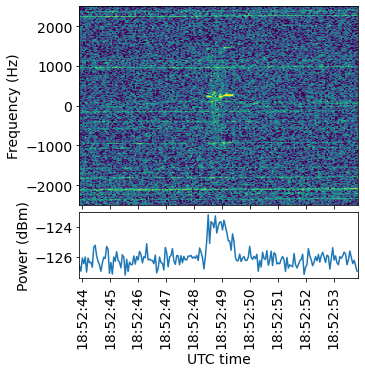

...

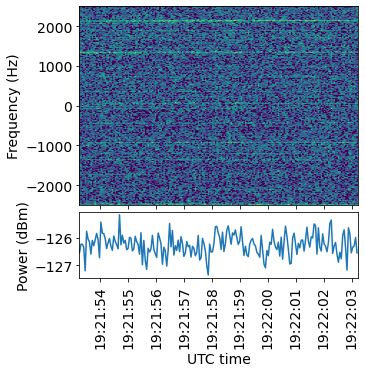

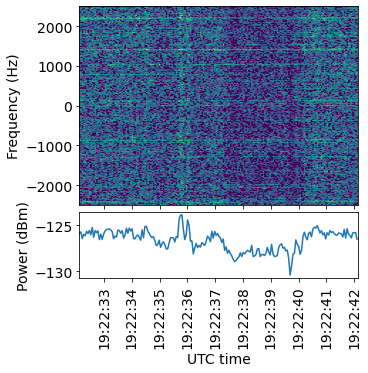

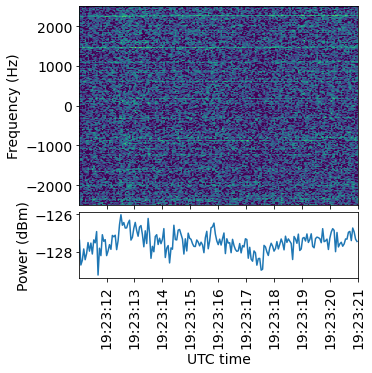

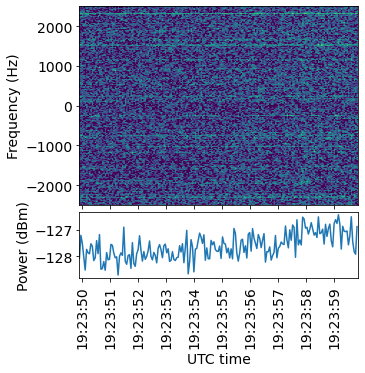

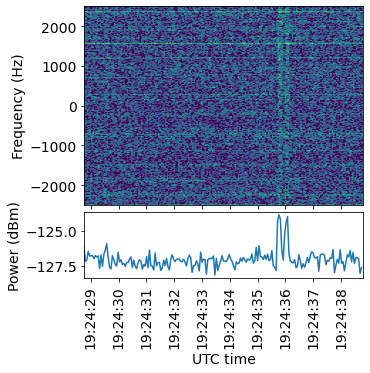

In [10]:
freq_axis = np.fft.fftshift(np.fft.fftfreq(NFFT, 1/fs))
freq_sel = np.abs(freq_axis) <= 2.5e3
freq_sel_pwr = (freq_axis >= -1250) & (freq_axis <= 1750)
for ts in np.arange(147, 2220, 38.875):
    fig, axs = plt.subplots(2, 1, figsize=(5, 5), sharex=True,
                            gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0.05)
    a, b = int(ts*fs/NFFT), int((ts+10)*fs/NFFT)
    t0, t1 = t[a], t[b]
    x_sel = x[a:b]
    pwr_t = np.sum(x_sel[:, freq_sel_pwr], axis=1)
    axs[0].imshow(10*np.log10(x_sel[:, freq_sel].T[::-1, :]),
               aspect='auto', vmin=20, vmax=40,
               extent=[mdates.date2num(t0), mdates.date2num(t1),
                       freq_axis[freq_sel][0], freq_axis[freq_sel][-1]])
    axs[1].plot(t[a:b], 10*np.log10(pwr_t) + transfer_to_dbm)
    axs[0].set_ylabel('Frequency (Hz)')
    axs[1].set_ylabel('Power (dBm)')
    axs[1].set_xlabel('UTC time')
    axs[1].tick_params(axis='x', labelrotation=90)

Packet power: -128.03 dBm


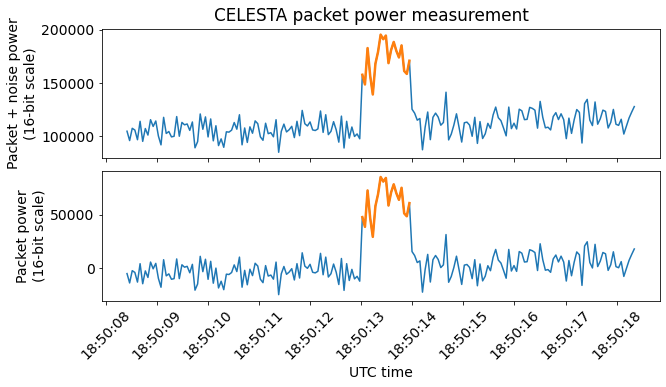

In [11]:
ts = 147
a, b = int(ts*fs/NFFT), int((ts+10)*fs/NFFT)
t0, t1 = t[a], t[b]
x_sel = x[a:b]
pwr_t = np.sum(x_sel[:, freq_sel_pwr], axis=1)
sel_packet = (pwr_t >= 130e3) & (np.arange(pwr_t.size) < 120)
fig, axs = plt.subplots(2, 1, sharex=True)
axs[0].plot(t[a:b], pwr_t)
axs[0].plot(t[a:b][sel_packet], pwr_t[sel_packet], linewidth=2.5)
noise_floor = np.average(pwr_t[~sel_packet])
pwr_packet = pwr_t - noise_floor
axs[1].plot(t[a:b], pwr_packet)
axs[1].plot(t[a:b][sel_packet], pwr_packet[sel_packet], linewidth=2.5)
plt.subplots_adjust(hspace=0.1)
axs[1].tick_params(axis='x', labelrotation=45)
axs[1].set_xlabel('UTC time')
axs[0].set_ylabel('Packet + noise power\n(16-bit scale)')
axs[1].set_ylabel('Packet power\n(16-bit scale)')
pwr_packet_dbm = 10*np.log10(np.average(pwr_packet[sel_packet])) + transfer_to_dbm
plt.suptitle('CELESTA packet power measurement', y=0.94)
print(f'Packet power: {pwr_packet_dbm:.02f} dBm')

In [13]:
free_space_path_loss = 161.6
rx_antenna_gain = 12
eirp_tx = pwr_packet_dbm + free_space_path_loss - rx_antenna_gain
eirp_tx

21.574429130554194